# COVID-19 World Vaccination Progress
#### Daily and Total Vaccination for COVID-19 in the World


### Inspiration

* Track COVID-19 vaccination in the World, answer instantly to your questions :

    Which country is using what vaccine?

    In which country the vaccination programme is more advanced?

    Where are vaccinated more people per day? 
    
    Where are vaccinated more people per country?


### Content

The data (country vaccinations) contains the following information:

1. Country- this is the country for which the vaccination information is provided;
2. Country ISO Code - ISO code for the country;
3. Date - date for the data entry; for some of the dates we have only the daily vaccinations, for others, only the (cumulative) total;
4. Total number of vaccinations - this is the absolute number of total immunizations in the country;
5. Total number of people vaccinated - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;
6. Total number of people fully vaccinated - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;
7. Daily vaccinations (raw) - for a certain data entry, the number of vaccination for that date/country;
8. Daily vaccinations - for a certain data entry, the number of vaccination for that date/country;
9. Total vaccinations per hundred - ratio (in percent) between vaccination number and total population up to the date in the country;
10. Total number of people vaccinated per hundred - ratio (in percent) between population immunized and total population up to the date in the country;
11. Total number of people fully vaccinated per hundred - ratio (in percent) between population fully immunized and total population up to the date in the country;
12. Number of vaccinations per day - number of daily vaccination for that day and country;
13. Daily vaccinations per million - ratio (in ppm) between vaccination number and total population for the current date in the country;
14. Vaccines used in the country - total number of vaccines used in the country (up to date);
15. Source name - source of the information (national authority, international organization, local organization etc.);
16. Source website - website of the source of information.


There is a second file added recently (country vaccinations by manufacturer), with the following columns:

    Location - country;
       
    Date - date;
    
    Vaccine - vaccine type;
    
    Total number of vaccinations - total number of vaccinations / current time and vaccine type.

THE STEPS TO BE FOLLOWED ARE ----

    1. Data Sourcing and Understanding
    2. Data Cleaning
    3. Explorating Data Analysis
    4. Recommendations/Conclusion

Let's begin!!

#### DATA SOURCING AND UNDERSTANDING

In [1]:
#to avoid warnings
import warnings
warnings.filterwarnings('ignore')

#os
import os

#linear algebra libraries
import numpy as np, pandas as pd
import pandas_profiling as pp

#libraries for plotting graphs
import matplotlib.pyplot as plt, seaborn as sns, matplotlib
import plotly.express as px
import plotly.figure_factory as ff

#for hypothesis checking
from scipy.stats import mannwhitneyu

#for model building
from sklearn.preprocessing import scale, StandardScaler
from sklearn import linear_model
from sklearn import metrics
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, GridSearchCV, StratifiedKFold, train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, mean_squared_error as MSE

In [2]:
vaccine = pd.read_csv("./vaccine/country_vaccinations.csv")
vaccine.head(10)

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.00,0.00,NaN,NaN,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
5,Afghanistan,AFG,2021-02-27,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
6,Afghanistan,AFG,2021-02-28,8200.0,8200.0,NaN,NaN,1367.0,0.02,0.02,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
7,Afghanistan,AFG,2021-03-01,NaN,NaN,NaN,NaN,1580.0,NaN,NaN,NaN,41.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
8,Afghanistan,AFG,2021-03-02,NaN,NaN,NaN,NaN,1794.0,NaN,NaN,NaN,46.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...
9,Afghanistan,AFG,2021-03-03,NaN,NaN,NaN,NaN,2008.0,NaN,NaN,NaN,52.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...


In [3]:
pp.ProfileReport(vaccine)

In [4]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11983 entries, 0 to 11982
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              11983 non-null  object 
 1   iso_code                             11983 non-null  object 
 2   date                                 11983 non-null  object 
 3   total_vaccinations                   7202 non-null   float64
 4   people_vaccinated                    6529 non-null   float64
 5   people_fully_vaccinated              4683 non-null   float64
 6   daily_vaccinations_raw               6055 non-null   float64
 7   daily_vaccinations                   11782 non-null  float64
 8   total_vaccinations_per_hundred       7202 non-null   float64
 9   people_vaccinated_per_hundred        6529 non-null   float64
 10  people_fully_vaccinated_per_hundred  4683 non-null   float64
 11  daily_vaccinations_per_milli

In [5]:
vaccine.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
count,7.202000e+03,6.529000e+03,4.683000e+03,6.055000e+03,1.178200e+04,7202.000000,6529.000000,4683.000000,11782.000000
mean,3.888733e+06,2.697733e+06,1.249689e+06,1.219362e+05,7.184736e+04,12.870934,9.624845,4.677807,2850.698863
std,1.533029e+07,9.690399e+06,5.264455e+06,4.553123e+05,3.138924e+05,20.978965,14.021542,9.220927,4885.902708
min,0.000000e+00,0.000000e+00,1.000000e+00,-2.928600e+04,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,5.005300e+04,4.452600e+04,2.071550e+04,2.783000e+03,9.080000e+02,1.010000,0.950000,0.510000,328.000000
50%,3.463725e+05,2.884060e+05,1.455440e+05,1.487200e+04,5.960500e+03,4.955000,3.930000,1.820000,1398.500000
75%,1.623680e+06,1.200793e+06,5.910560e+05,5.890400e+04,2.717200e+04,15.540000,11.660000,4.800000,3546.000000
max,1.983170e+08,1.258229e+08,7.849829e+07,7.185000e+06,5.190143e+06,196.520000,106.330000,90.180000,118759.000000


In [6]:
vaccine.shape

(11983, 15)

In [7]:
vaccine.columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')

In [8]:
#country wrt vaccine details
cntry_vacc_df = pd.read_csv("./vaccine/country_vaccinations_by_manufacturer.csv")
cntry_vacc_df.head(10)

,location,date,vaccine,total_vaccinations
0,Chile,2020-12-24,Pfizer/BioNTech,420
1,Chile,2020-12-25,Pfizer/BioNTech,5198
2,Chile,2020-12-26,Pfizer/BioNTech,8338
3,Chile,2020-12-27,Pfizer/BioNTech,8649
4,Chile,2020-12-28,Pfizer/BioNTech,8649
5,Chile,2020-12-29,Pfizer/BioNTech,8649
6,Chile,2020-12-30,Pfizer/BioNTech,8649
7,Chile,2020-12-31,Pfizer/BioNTech,8649
8,Chile,2021-01-01,Pfizer/BioNTech,8649
9,Chile,2021-01-02,Pfizer/BioNTech,8649


In [9]:
pp.ProfileReport(cntry_vacc_df)

In [10]:
cntry_vacc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2378 entries, 0 to 2377
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   location            2378 non-null   object
 1   date                2378 non-null   object
 2   vaccine             2378 non-null   object
 3   total_vaccinations  2378 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 74.4+ KB


In [11]:
cntry_vacc_df.describe()

,total_vaccinations
count,2.378000e+03
mean,4.134935e+06
std,1.346630e+07
min,0.000000e+00
25%,1.265250e+04
50%,1.134030e+05
75%,1.228416e+06
max,1.028775e+08


In [12]:
cntry_vacc_df.shape

(2378, 4)

Let's proceed to the main step now!!

#### DATA CLEANING

###### Handling Datatypes

In [13]:
#datatype analysis
vaccine.dtypes

country                                 object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
daily_vaccinations_raw                 float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
daily_vaccinations_per_million         float64
vaccines                                object
source_name                             object
source_website                          object
dtype: object

In [14]:
# datetime datatype
vaccine[['date']] = vaccine[['date']].apply(pd.to_datetime)

In [15]:
#checking
vaccine.dtypes

country                                        object
iso_code                                       object
date                                   datetime64[ns]
total_vaccinations                            float64
people_vaccinated                             float64
people_fully_vaccinated                       float64
daily_vaccinations_raw                        float64
daily_vaccinations                            float64
total_vaccinations_per_hundred                float64
people_vaccinated_per_hundred                 float64
people_fully_vaccinated_per_hundred           float64
daily_vaccinations_per_million                float64
vaccines                                       object
source_name                                    object
source_website                                 object
dtype: object

In [16]:
# datetime datatype
cntry_vacc_df[['date']] = cntry_vacc_df[['date']].apply(pd.to_datetime)

In [17]:
#checking
cntry_vacc_df.dtypes

location                      object
date                  datetime64[ns]
vaccine                       object
total_vaccinations             int64
dtype: object

Datatypes went well now!!!

###### Handling Duplicacy and Null Values

From the definition of the following columns - 

Total number of vaccinations - this is the absolute number of total immunizations in the country;

Total number of people vaccinated - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;

Total number of people fully vaccinated - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;

Daily vaccinations (raw) - for a certain data entry, the number of vaccination for that date/country;

Daily vaccinations - for a certain data entry, the number of vaccination for that date/country;

Total vaccinations per hundred - ratio (in percent) between vaccination number and total population up to the date in the country;

Total number of people vaccinated per hundred - ratio (in percent) between population immunized and total population up to the date in the country;

Total number of people fully vaccinated per hundred - ratio (in percent) between population fully immunized and total population up to the date in the country;

Number of vaccinations per day - number of daily vaccination for that day and country


Let's check each column more closely!!

DATASET -- COUNTRY VACCINATION MANUFACTURERS DETAILS

In [18]:
#checking the variables which has true null values
true_null_1 = cntry_vacc_df.isnull().any()[cntry_vacc_df.isnull().any()==True]
true_null_1

Series([], dtype: bool)

DATASET -- COUNTRY VACCINATION DETAILS

In [19]:
#checking the variables which has true null values
true_null = vaccine.isnull().any()[vaccine.isnull().any()==True]
true_null

total_vaccinations                     True
people_vaccinated                      True
people_fully_vaccinated                True
daily_vaccinations_raw                 True
daily_vaccinations                     True
total_vaccinations_per_hundred         True
people_vaccinated_per_hundred          True
people_fully_vaccinated_per_hundred    True
daily_vaccinations_per_million         True
dtype: bool

In [20]:
#checking for null values
vaccine.isnull().sum(axis=0)

country                                   0
iso_code                                  0
date                                      0
total_vaccinations                     4781
people_vaccinated                      5454
people_fully_vaccinated                7300
daily_vaccinations_raw                 5928
daily_vaccinations                      201
total_vaccinations_per_hundred         4781
people_vaccinated_per_hundred          5454
people_fully_vaccinated_per_hundred    7300
daily_vaccinations_per_million          201
vaccines                                  0
source_name                               0
source_website                            0
dtype: int64

In [21]:
#null values on percentage wise
nulldetails = round(100*(vaccine.isnull().sum()/len(vaccine.index)), 2)

#taking 50% on majority of NaN values in the column
nulldetails.loc[nulldetails >= 50]

people_fully_vaccinated                60.92
people_fully_vaccinated_per_hundred    60.92
dtype: float64

In [22]:
#null values on percentage wise
nulldetails1 = round(100*(vaccine.isnull().sum()/len(vaccine.index)), 2)

#taking 50% as maximum of NaN values in the column
nulldetails1.loc[nulldetails1 <= 50]

country                            0.00
iso_code                           0.00
date                               0.00
total_vaccinations                39.90
people_vaccinated                 45.51
daily_vaccinations_raw            49.47
daily_vaccinations                 1.68
total_vaccinations_per_hundred    39.90
people_vaccinated_per_hundred     45.51
daily_vaccinations_per_million     1.68
vaccines                           0.00
source_name                        0.00
source_website                     0.00
dtype: float64

We have quite large cardinality and missing data. Let's go with the first important column - total_vaccinations AND people_vaccinated

In [23]:
# COLUMN --- total_vaccinations
vaccine = vaccine.drop(vaccine[vaccine.total_vaccinations.isna()].index)

# COLUMN -- people_vaccinated
vaccine = vaccine.drop(vaccine[vaccine.people_vaccinated.isna()].index)

# checking NA values
vaccine.isna().sum()

country                                   0
iso_code                                  0
date                                      0
total_vaccinations                        0
people_vaccinated                         0
people_fully_vaccinated                1761
daily_vaccinations_raw                  994
daily_vaccinations                      151
total_vaccinations_per_hundred            0
people_vaccinated_per_hundred             0
people_fully_vaccinated_per_hundred    1761
daily_vaccinations_per_million          151
vaccines                                  0
source_name                               0
source_website                            0
dtype: int64

We have other similar variables like people_vaccinated_per_hundred AND total_vaccinations_per_hundred, etc. Let's see how they are related with the above two features.

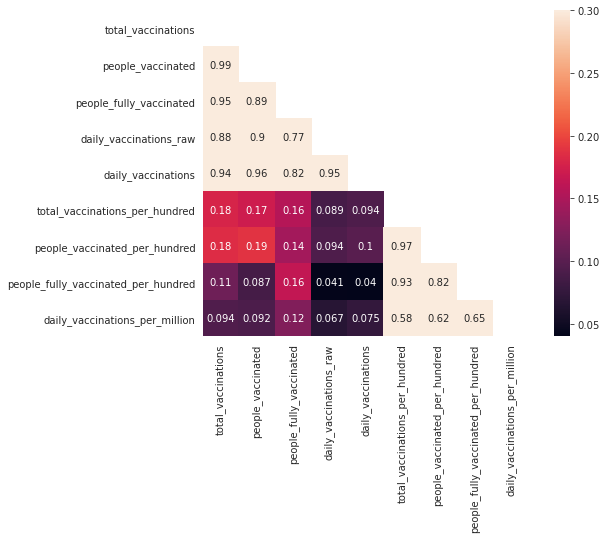

In [24]:
#checking correlation
corr = vaccine.corr()

#mask
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

#heatmap
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(9, 6))
    ax = sns.heatmap(corr, annot=True, mask=mask, vmax=.3, square=True)

    We can say that - 
    
    1. people_vaccinated and people_vaccinated_per_hundred greatly correlates with total_vaccinations and total_vaccinations_per_hundred.
    
    2. Likewise, daily_vaccinations and daily_vaccinations_per_million greatly correlates with people_vaccinated and people_vaccinated_per_hundred.
    
    3. people_fully_vaccinated and people_fully_vaccinated_per_hundred greatly correlates with total_vaccinations and total_vaccinations_per_hundred.
    
    4. daily_vaccinations_raw greatly correlates with daily_vaccinations.



HOW TO DEAL WITH IT? 

We can check for the hypothesis value and find out what's the p-value of their corelation and then decide whether to keep the column or delete it. Let's see what are the different hypothesis technique that can be proceed with column distributions ---

    1. Here we can try Mann-Whithey U test for the same.
    2. Two-sample Z test, can be used for checking two independent data groups and deciding whether sample mean of two group is equal or not.
    
Reference - https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/

Let's go with first one, as it will have concised code.

###### Mann-Whitney U Test

Tests whether the distributions of two independent samples are equal or not.

Assumptions----

    Observations in each sample are independent and identically distributed (iid).
    
    Observations in each sample can be ranked.

Interpretation----

    H0: the distributions of both samples are equal.
    
    H1: the distributions of both samples are not equal.
    

Conclusion----

if p_value < 0.05:
    
    print('Reject Null Hypothesis (Significant difference between two samples)')
        
else:

    print('Do not Reject Null Hypothesis (No significant difference between two samples)')

In [25]:
#function for hypothesis check

def hypothesis_check(data1, data2) :
    
    # perform mann whitney test
    stat, p_value = mannwhitneyu(data1, data2)
    print('Statistics = %.2f, \np-value = %.13f' % (stat, p_value))
    
    # Level of significance
    alpha = 0.05
    
    # conclusion
    if p_value < alpha:
        print('Reject Null Hypothesis (Significant difference between two samples)')
    else:
        print('Do not Reject Null Hypothesis (No significant difference between two samples)')

In [26]:
#function to use fillna in thr column if we "Reject Null Hypothesis"

def fill_na(column):
    for c in column :
        vaccine[column] = vaccine[column].fillna(0)

In [27]:
#checking total_vaccinations AND people_vaccinated
hypothesis_check(vaccine['total_vaccinations'], vaccine['people_vaccinated'])

Statistics = 19756485.00, 
p-value = 0.0000010981784
Reject Null Hypothesis (Significant difference between two samples)


In [28]:
#checking total_vaccinations_per_hundred AND people_vaccinated_per_hundred
hypothesis_check(vaccine['total_vaccinations_per_hundred'], vaccine['people_vaccinated_per_hundred'])

Statistics = 19237747.50, 
p-value = 0.0000000000003
Reject Null Hypothesis (Significant difference between two samples)


In [29]:
#checking people_vaccinated AND daily_vaccinations
hypothesis_check(vaccine['people_vaccinated'], vaccine['daily_vaccinations'])

Statistics = 8506808.50, 
p-value = 0.0000000000000
Reject Null Hypothesis (Significant difference between two samples)


In [30]:
#checking people_vaccinated_per_hundred AND daily_vaccinations_per_million
hypothesis_check(vaccine['people_vaccinated_per_hundred'], vaccine['daily_vaccinations_per_million'])

Statistics = 505324.50, 
p-value = 0.0000000000000
Reject Null Hypothesis (Significant difference between two samples)


In [31]:
#checking people_fully_vaccinated AND total_vaccinations
hypothesis_check(vaccine['people_fully_vaccinated'], vaccine['total_vaccinations'])

Statistics = 18241725.00, 
p-value = 0.0000000000000
Reject Null Hypothesis (Significant difference between two samples)


In [32]:
#checking people_fully_vaccinated_per_hundred AND total_vaccinations_per_hundred
hypothesis_check(vaccine['people_fully_vaccinated_per_hundred'], vaccine['total_vaccinations_per_hundred'])

Statistics = 19769331.00, 
p-value = 0.0000014794448
Reject Null Hypothesis (Significant difference between two samples)


In [33]:
#checking daily_vaccinations_raw AND daily_vaccinations
hypothesis_check(vaccine['daily_vaccinations_raw'], vaccine['daily_vaccinations'])

Statistics = 17559907.00, 
p-value = 0.0000000000000
Reject Null Hypothesis (Significant difference between two samples)


Hence, we can conclude that, p-values are much less than 0.05, which means we will reject our hypothesis. So, let's just fill missing values with zeros.

In [34]:
vaccine.columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')

In [35]:
#columns to be filled with 0
cols = ['total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million']

#filling NA values
fill_na(cols)

#check any NA values
vaccine.isna().sum()

country                                0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations_raw                 0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
dtype: int64

Everything went well so far!!! Moving Forward now!!

###### Handling any replacement in column values

iso_code : ISO code for the country.

In [36]:
#iso code for country
vaccine[vaccine.iso_code.isna()].country.unique()

array([], dtype=object)

In [37]:
#fillna country values for systematic values
vaccine[vaccine.country == 'England'] = vaccine[vaccine.country == 'England'].fillna('GB-ENG')
vaccine[vaccine.country == 'Northern Ireland'] == vaccine[vaccine.country == 'Northern Ireland'].fillna('GB-NIR')
vaccine[vaccine.country == 'Scotland'] = vaccine[vaccine.country == 'Scotland'].fillna('GB-SCT')
vaccine[vaccine.country == 'Wales'] = vaccine[vaccine.country == 'Wales'].fillna('GB-WLS')
vaccine = vaccine.fillna('NC')

In [38]:
vaccine['iso_code'].unique()

array(['AFG', 'ALB', 'AND', 'AGO', 'AIA', 'ATG', 'ARG', 'ARM', 'AUS',
       'AUT', 'AZE', 'BHS', 'BHR', 'BGD', 'BRB', 'BLR', 'BEL', 'BLZ',
       'BMU', 'BTN', 'BOL', 'BWA', 'BRA', 'BRN', 'BGR', 'KHM', 'CMR',
       'CAN', 'CPV', 'CYM', 'CHL', 'COL', 'CRI', 'CIV', 'HRV', 'CYP',
       'CZE', 'DNK', 'DMA', 'DOM', 'ECU', 'EGY', 'SLV', 'OWID_ENG', 'GNQ',
       'EST', 'SWZ', 'FRO', 'FLK', 'FJI', 'FIN', 'FRA', 'GAB', 'GMB',
       'GEO', 'DEU', 'GHA', 'GIB', 'GRC', 'GRL', 'GRD', 'GTM', 'GGY',
       'GUY', 'HND', 'HKG', 'HUN', 'ISL', 'IND', 'IDN', 'IRN', 'IRQ',
       'IRL', 'IMN', 'ISR', 'ITA', 'JAM', 'JPN', 'JEY', 'JOR', 'KAZ',
       'KEN', 'OWID_KOS', 'KWT', 'KGZ', 'LAO', 'LVA', 'LBN', 'LIE', 'LTU',
       'LUX', 'MAC', 'MWI', 'MYS', 'MDV', 'MLI', 'MLT', 'MRT', 'MUS',
       'MEX', 'MDA', 'MCO', 'MNE', 'MSR', 'MAR', 'MOZ', 'MMR', 'NAM',
       'NLD', 'NZL', 'NGA', 'MKD', 'OWID_CYN', 'OWID_NIR', 'NOR', 'OMN',
       'PAK', 'PSE', 'PAN', 'PNG', 'PRY', 'PER', 'PHL', 'POL', 'PRT',
       

In [39]:
vaccine.shape

(6443, 15)

In [40]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6443 entries, 0 to 11982
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   country                              6443 non-null   object        
 1   iso_code                             6443 non-null   object        
 2   date                                 6443 non-null   datetime64[ns]
 3   total_vaccinations                   6443 non-null   float64       
 4   people_vaccinated                    6443 non-null   float64       
 5   people_fully_vaccinated              6443 non-null   float64       
 6   daily_vaccinations_raw               6443 non-null   float64       
 7   daily_vaccinations                   6443 non-null   float64       
 8   total_vaccinations_per_hundred       6443 non-null   float64       
 9   people_vaccinated_per_hundred        6443 non-null   float64       
 10  people_full

Now we have cleaned dataset to proceed further!!!!

Let's do some data preparation!!!!

##### DATA PREPARATION

In [41]:
cntry_vaccine = vaccine.groupby(["country", "iso_code", "vaccines"])['total_vaccinations', 
                                                                       'total_vaccinations_per_hundred',
                                                                      'daily_vaccinations',
                                                                      'daily_vaccinations_per_million',
                                                                      'people_vaccinated',
                                                                      'people_vaccinated_per_hundred',
                                                                       'people_fully_vaccinated', 
                                                                       'people_fully_vaccinated_per_hundred'
                                                                      ].max().reset_index()

cntry_vaccine.columns = ["Country", "iso_code", "Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million", "People vaccinated", "People vaccinated per hundred",
                           'People fully vaccinated', 'People fully vaccinated percent']

In [42]:
cntry_vaccine.head(10)

,Country,iso_code,Vaccines,Total vaccinations,Percent,Daily vaccinations,Daily vaccinations per million,People vaccinated,People vaccinated per hundred,People fully vaccinated,People fully vaccinated percent
0,Afghanistan,AFG,Oxford/AstraZeneca,120000.0,0.31,3000.0,77.0,120000.0,0.31,0.0,0.00
1,Albania,ALB,"Pfizer/BioNTech, Sinovac",6728.0,0.23,739.0,257.0,6073.0,0.21,655.0,0.02
2,Andorra,AND,"Oxford/AstraZeneca, Pfizer/BioNTech",15269.0,19.76,679.0,8788.0,9781.0,12.66,4484.0,5.80
3,Angola,AGO,Oxford/AstraZeneca,245442.0,0.75,10939.0,333.0,245442.0,0.75,0.0,0.00
4,Anguilla,AIA,Oxford/AstraZeneca,5835.0,38.89,331.0,22064.0,5835.0,38.89,0.0,0.00
5,Antigua and Barbuda,ATG,Oxford/AstraZeneca,27032.0,27.60,895.0,9139.0,27032.0,27.60,0.0,0.00
6,Argentina,ARG,"Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V",5935146.0,13.13,169014.0,3740.0,5163344.0,11.42,771802.0,1.71
7,Armenia,ARM,Sputnik V,565.0,0.02,0.0,0.0,565.0,0.02,0.0,0.00
8,Australia,AUS,"Oxford/AstraZeneca, Pfizer/BioNTech",159294.0,0.62,11765.0,461.0,159294.0,0.62,0.0,0.00
9,Austria,AUT,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",2334458.0,25.92,53409.0,5930.0,1658035.0,18.41,676423.0,7.51


In [43]:
cntry_vaccine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 171 entries, 0 to 170
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          171 non-null    object 
 1   iso_code                         171 non-null    object 
 2   Vaccines                         171 non-null    object 
 3   Total vaccinations               171 non-null    float64
 4   Percent                          171 non-null    float64
 5   Daily vaccinations               171 non-null    float64
 6   Daily vaccinations per million   171 non-null    float64
 7   People vaccinated                171 non-null    float64
 8   People vaccinated per hundred    171 non-null    float64
 9   People fully vaccinated          171 non-null    float64
 10  People fully vaccinated percent  171 non-null    float64
dtypes: float64(8), object(3)
memory usage: 14.8+ KB


In [44]:
vaccines_grp = cntry_vaccine.Vaccines.unique()

for v in vaccines_grp:
    countries_grp = cntry_vaccine.loc[cntry_vaccine.Vaccines==v, 'Country'].values
    print(f"Vaccines: {v}: \nCountries: {list(countries_grp)}\n")

Vaccines: Oxford/AstraZeneca: 
Countries: ['Afghanistan', 'Angola', 'Anguilla', 'Antigua and Barbuda', 'Bahamas', 'Bangladesh', 'Barbados', 'Belize', 'Bhutan', 'Botswana', 'Brunei', 'Cape Verde', "Cote d'Ivoire", 'Dominica', 'Eswatini', 'Falkland Islands', 'Fiji', 'Gambia', 'Georgia', 'Ghana', 'Grenada', 'Guyana', 'Jamaica', 'Kosovo', 'Malawi', 'Mali', 'Mauritius', 'Moldova', 'Montserrat', 'Myanmar', 'Nigeria', 'Papua New Guinea', 'Saint Helena', 'Saint Kitts and Nevis', 'Saint Lucia', 'Sao Tome and Principe', 'Sierra Leone', 'Solomon Islands', 'South Sudan', 'Sri Lanka', 'Sudan', 'Suriname', 'Taiwan', 'Togo', 'Trinidad and Tobago', 'Uganda', 'Ukraine', 'Uzbekistan', 'Vietnam', 'Zambia']

Vaccines: Pfizer/BioNTech, Sinovac: 
Countries: ['Albania', 'Chile', 'Colombia', 'Hong Kong', 'Malaysia', 'Turkey', 'Uruguay']

Vaccines: Oxford/AstraZeneca, Pfizer/BioNTech: 
Countries: ['Andorra', 'Australia', 'England', 'Guernsey', 'Isle of Man', 'Jersey', 'Northern Ireland', 'Oman', 'Scotland', 'S

In [45]:
cntry_vaccine_time = vaccine[["country", "vaccines", "date", 'total_vaccinations', 
                                'total_vaccinations_per_hundred',  'people_vaccinated','people_vaccinated_per_hundred',
                               'daily_vaccinations','daily_vaccinations_per_million', 
                                'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred'
                               ]].dropna()

cntry_vaccine_time.columns = ["Country", "Vaccines", "Date", 'Total vaccinations', 'Percent', 'People vaccinated', 'People percent',
                               "Daily vaccinations", "Daily vaccinations per million", 
                                'People fully vaccinated', 'People fully vaccinated percent']

In [46]:
countries = ['Austria', 'Belgium', 'Bulgaria','Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
             'Greece', 'Hungary','India' , 'Ireland', 'Israel', 'Italy', 'Latvia','Lithuania', 'Luxembourg', 'Malta',
             'Netherlands', 'Norway','Poland', 'Portugal', 'Romania', 'Serbia', 'Slovakia', 'Spain', 'Sweden',
             'United Kingdom', 'United States', 'China']

Proceeding to the EDA part!!!

###### EXPLORATORY DATA ANALYSIS

In [47]:
cntry_vaccine.columns

Index(['Country', 'iso_code', 'Vaccines', 'Total vaccinations', 'Percent',
       'Daily vaccinations', 'Daily vaccinations per million',
       'People vaccinated', 'People vaccinated per hundred',
       'People fully vaccinated', 'People fully vaccinated percent'],
      dtype='object')

###### Univariate analysis

In [48]:
def distplot_check(column):
    plt.title('Checking Outliers with distplot()')
    sns.distplot(column, bins=10)
    plt.show()

In [49]:
def treat_outlier(column):
    #taking log of the values in both the axes
    cntry_vaccine[column] = np.log1p(cntry_vaccine[column])

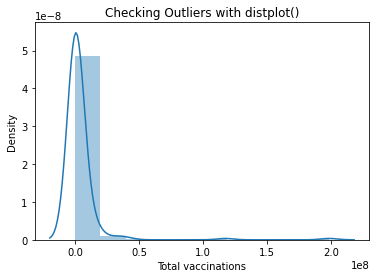

In [50]:
distplot_check(cntry_vaccine["Total vaccinations"])
treat_outlier("Total vaccinations")

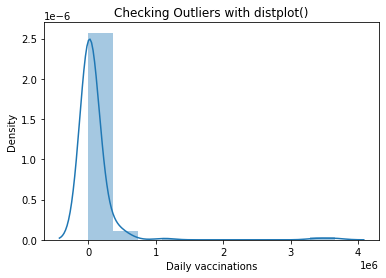

In [51]:
distplot_check(cntry_vaccine["Daily vaccinations"])
treat_outlier("Daily vaccinations")

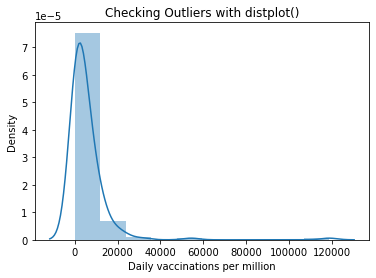

In [52]:
distplot_check(cntry_vaccine["Daily vaccinations per million"])
treat_outlier("Daily vaccinations per million")

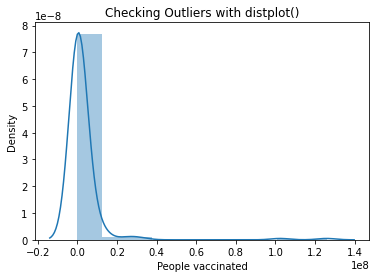

In [53]:
distplot_check(cntry_vaccine["People vaccinated"])
treat_outlier("People vaccinated")

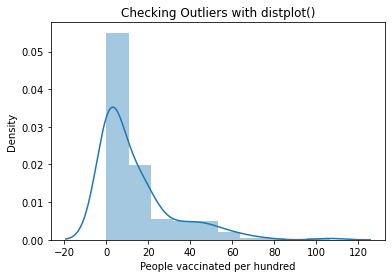

In [54]:
distplot_check(cntry_vaccine["People vaccinated per hundred"])
treat_outlier("People vaccinated per hundred")

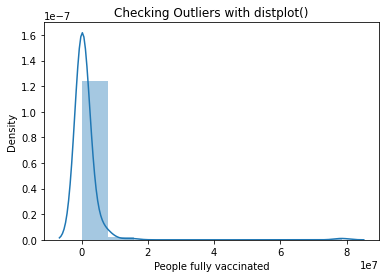

In [55]:
distplot_check(cntry_vaccine["People fully vaccinated"])
treat_outlier("People fully vaccinated")

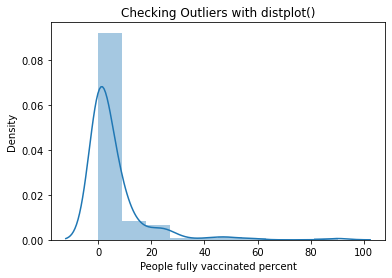

In [56]:
distplot_check(cntry_vaccine["People fully vaccinated percent"])
treat_outlier("People fully vaccinated percent")

Outliers are treated well compared to previous analysis. 

###### Bivariate Analysis

In [57]:
cntry_vaccine.columns

Index(['Country', 'iso_code', 'Vaccines', 'Total vaccinations', 'Percent',
       'Daily vaccinations', 'Daily vaccinations per million',
       'People vaccinated', 'People vaccinated per hundred',
       'People fully vaccinated', 'People fully vaccinated percent'],
      dtype='object')

###### How vaccines are related to other parameters?

In [58]:
def boxplot_check(title_name, col1, col2):
    fig = plt.figure(figsize=(10, 5))
    plt.title(title_name)
    plt.xticks(rotation = 90)
    sns.boxplot(cntry_vaccine[col1], cntry_vaccine[col2])
    plt.show()

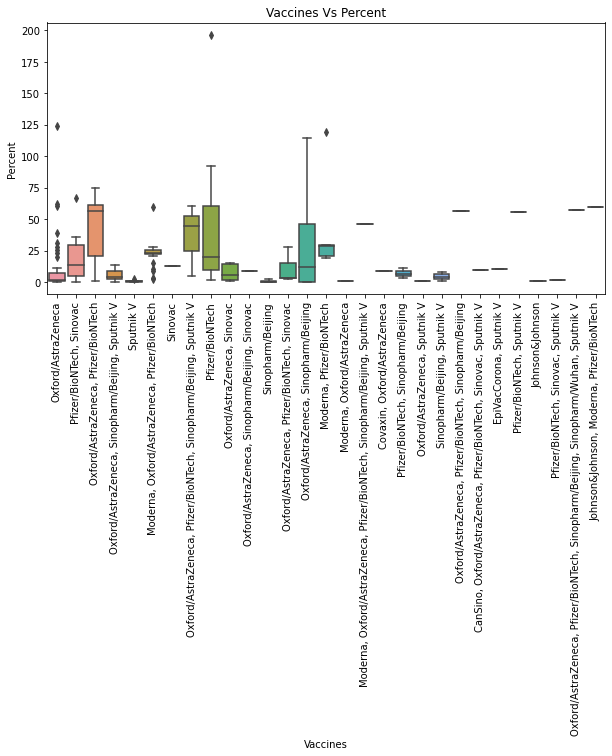

In [59]:
boxplot_check("Vaccines Vs Percent", "Vaccines", "Percent")

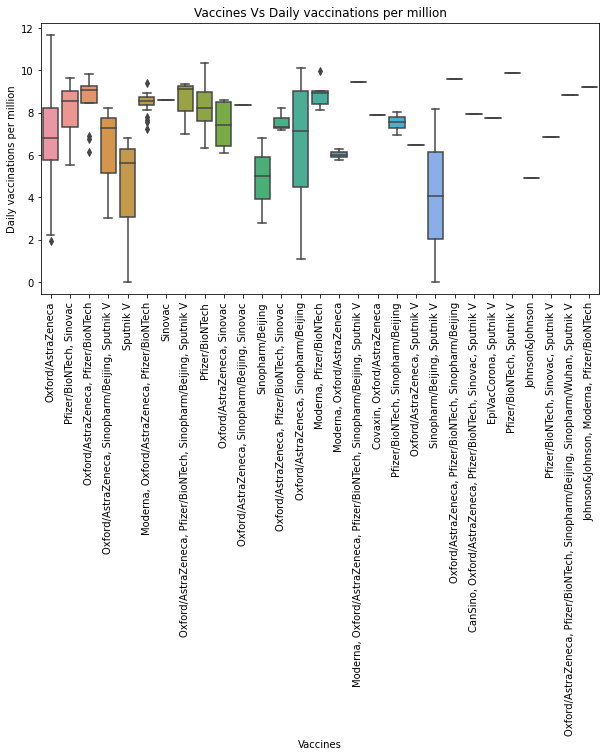

In [60]:
boxplot_check("Vaccines Vs Daily vaccinations per million", "Vaccines", "Daily vaccinations per million")

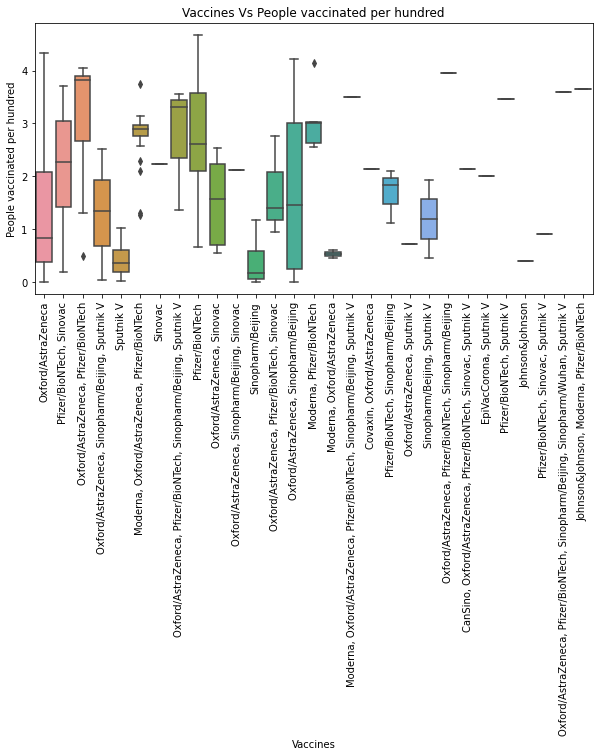

In [61]:
boxplot_check("Vaccines Vs People vaccinated per hundred", "Vaccines", "People vaccinated per hundred")

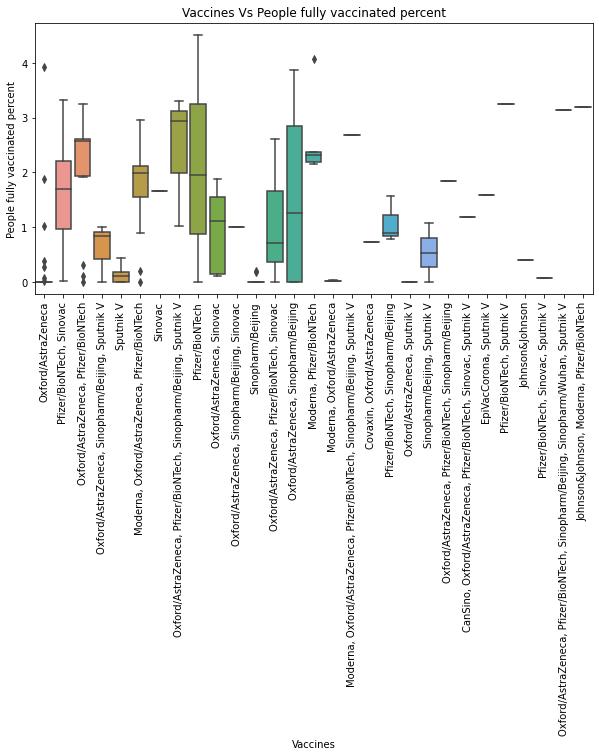

In [62]:
boxplot_check("Vaccines Vs People fully vaccinated percent", "Vaccines", "People fully vaccinated percent")

Insights -

Top vaccines used for the people fully vaccinated, daily vaccinations and used percentage are Oxford/AstraZeneca and Pfizer/BioTech, Sinovac.

###### Multivariate Analysis

In [63]:
cntry_vaccine.columns

Index(['Country', 'iso_code', 'Vaccines', 'Total vaccinations', 'Percent',
       'Daily vaccinations', 'Daily vaccinations per million',
       'People vaccinated', 'People vaccinated per hundred',
       'People fully vaccinated', 'People fully vaccinated percent'],
      dtype='object')

###### Which vaccination scheme is used most in a country-wise?

In [64]:
def treemap_plot(value, tree_title):
    
    fig = px.treemap(cntry_vaccine, path = ['Vaccines', 'Country'], 
                 values = value,
                title = tree_title)
    fig.show()

In [65]:
val1 = 'Total vaccinations'
tit1 = "Total vaccinations per country, grouped by vaccine scheme"

treemap_plot(val1, tit1)

Insights -

Total Vaccinations as per the vaccines are done in the Bangladesh, Nigeria, Myanmar, Sri Lanka, Ghana, etc. under Oxford/AstraZeneca.

##### Where are vaccinated more people per day?

In [66]:
val2 = 'Daily vaccinations'
tit2 = "Daily vaccinations per country, grouped by vaccine scheme"

treemap_plot(val2, tit2)

Insights -

Daily Vaccinations are proceeded rapidly in the countries like Bangladesh, Ghana, Bhutan, etc. with the large number of the vaccinations of Oxford/AstaZeneca.

##### Where are vaccinated more people per country?

In [67]:
val3 = 'People vaccinated'
tit3 = "People vaccinated per country, grouped by vaccine scheme"

treemap_plot(val3, tit3)

Insights - 

Oxford/AstraZeneca is the vaccine used by many countries like Bangladesh, Nigeria, Sri Lanka, Bhutan, etc. where majority of the people are vaccinated.

###### Heatmap

In [69]:
cntry_vaccine.shape

(171, 11)

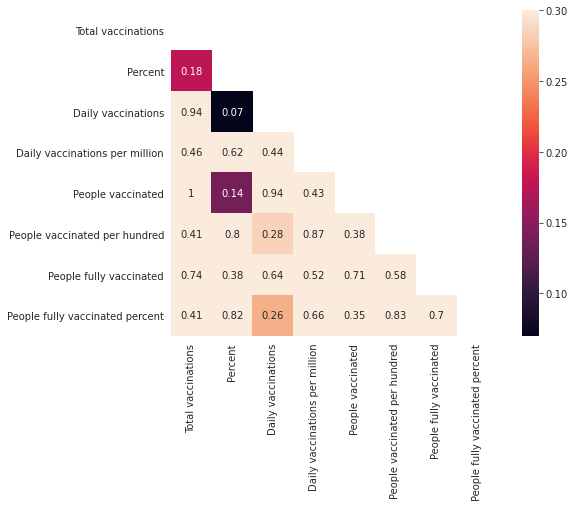

In [70]:
#checking correlation
corr1 = cntry_vaccine.corr()

#mask
mask = np.zeros_like(corr1)
mask[np.triu_indices_from(mask)] = True

#heatmap
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(9, 6))
    ax = sns.heatmap(corr1, annot=True, mask=mask, vmax=.3, square=True)

Highly correlated variables are - 

1. Total Vaccinations and People Vaccinated
2. Daily Vaccinations and Total Vaccinations
3. People Vaccinated and Daily Vaccinations

##### ---------------------------------------- by Sakshi Maharana -----------------------------------------------